<a href="https://colab.research.google.com/github/adewoleopeyemi/Neural-Style-Transfer/blob/master/NeuralStyleTransfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from google.colab import files
uploaded = files.upload()

Saving neural_style_transfer_image.jpg to neural_style_transfer_image.jpg


In [0]:
target_image = uploaded["neural_style_transfer_image.jpg"]

In [0]:
from google.colab import files
uploaded = files.upload()

Saving test_run.jpg to test_run.jpg


In [0]:
style_reference_image = uploaded['test_run.jpg']


In [0]:
from PIL import Image
import io

In [0]:
target_image = Image.open(io.BytesIO(target_image))
style_reference_image = Image.open(io.BytesIO(style_reference_image))

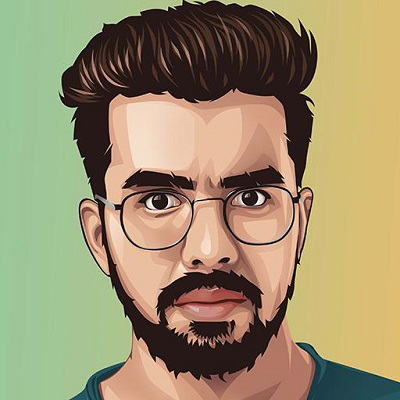

In [0]:
style_reference_image

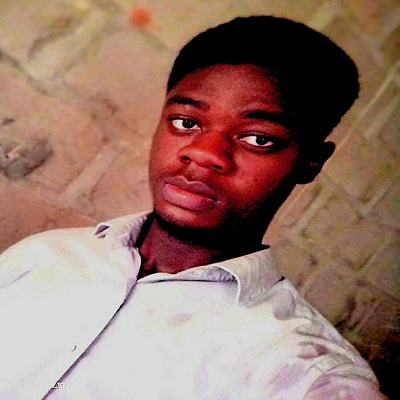

In [0]:
target_image

In [0]:
import numpy as np
from keras.applications import vgg19
from keras.preprocessing import image as imagek


def preprocess_image(image):
  img = imagek.img_to_array(image)
  img = np.expand_dims(img, axis = 0)
  img = vgg19.preprocess_input(img)
  return img


def deprocess_image(x):
  #Zero-centering by removing the mean pixel value from imagenet.This 
  #reverse a transformation done by vg19.preprocess_input
  x[:, :, 0] += 103.939
  x[:, :, 1] +=116.779
  x[:, :, 2] += 123.68
  x = x[:, :, ::-1]
  x = np.clip(x, 0, 255).astype("uint8")
  return x

Using TensorFlow backend.


In [0]:
from keras import backend as K

target_image = preprocess_image(target_image)
style_image = preprocess_image(style_reference_image)

target_images = K.constant(target_image)
style_images = K.constant(style_image)
#placeholder for generated image
combination_image = K.placeholder((1, 400, 400, 3))


#Combines the three images into a single batch
input_tensor = K.concatenate([target_images, style_images, combination_image], axis = 0)

model = vgg19.VGG19(input_tensor = input_tensor, 
                    weights = "imagenet", 
                    include_top =False)






80142336/80134624 [==============================] - 1s 0us/step








In [0]:
#Content loss
def content_loss(base, combination):
  return K.sum(K.square(combination - base))

#gram matrix
def gram_matrix(x):
  features = K.batch_flatten(K.permute_dimensions(x, (2, 0, 1)))
  gram = K.dot(features, K.transpose(features))
  return gram

#style_loss 
def style_loss(style, combination):
  s = gram_matrix(style)
  c = gram_matrix(combination)
  channels = 3
  size = 400 * 400
  return K.sum(K.square(s-c))/ (4 * (channels ** 2) * (size ** 2))



In [0]:
def total_variational_loss(x):
  a = K.square(
      x[:, :399, :399, :] - 
      x[:, 1:, :399, :])
  b =  K.square(
      x[:, :399, :399, :] - 
      x[:, :399, 1:, :])
  return K.sum(K.pow(a+b, 1.25))

In [0]:
#Dictionary that maps names to activation tensors
output_dicts = dict([(layer.name, layer.output) for layer in model.layers])

#layer used for content_loss
content_layer = "block5_conv2"
style_layers = ["block1_conv1",
                "block2_conv2",
                "block3_conv1", 
                "block4_conv1",
                "block5_conv1"
]

#weight in the weighted average of the loss components
total_variational_weight = 1e-4
style_weight = 1.2
content_weight = 0.2

loss = K.variable(0.)
layer_features = output_dicts[content_layer]
target_image_features = layer_features[0, :, :, :]
combination_features = layer_features[2, :, :, :]
loss = content_weight * content_loss(target_image_features, combination_features)

for layer_name in style_layers:
  layer_features = output_dicts[layer_name]
  style_reference_features = layer_features[1, :, :, :]
  combination_features = layer_features[2, :, :, :]
  sl = style_loss(style_reference_features, combination_features)
  loss += (style_weight / len(style_layers)) * sl

loss += total_variational_weight * total_variational_loss(combination_image)

In [0]:
grads = K.gradients(loss, combination_image)[0]
fetch_loss_and_grads = K.function([combination_image], (loss, grads))

class Evaluator(object):

  def __init__(self):
    self.loss_value = None
    self.grads_value = None

  def loss(self, x):
    assert self.loss_value is None
    x = x.reshape((1, 400, 400, 3))
    outs = fetch_loss_and_grads([x])
    loss_value = outs[0]
    grads_value = outs[1].flatten().astype("float64")
    self.loss_value = loss_value
    self.grads_value = grads_value
    return self.loss_value

  def grads(self, x):
    assert self.loss_value is not None
    grads_value = np.copy(self.grads_value)
    self.loss_value = None
    self.grads_value = None
    return grads_value

evaluator = Evaluator()

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


(480000,)
Start of iteration.  0
Current loss value:  5704289000.0


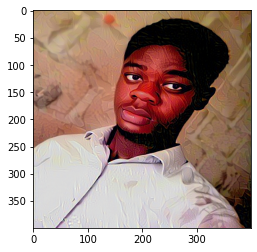

Start of iteration.  1
Current loss value:  1956390900.0


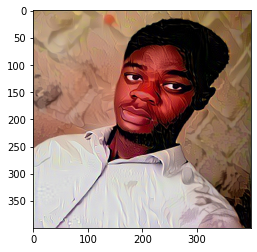

Start of iteration.  2
Current loss value:  1239210000.0


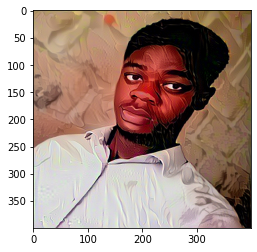

Start of iteration.  3
Current loss value:  954244800.0


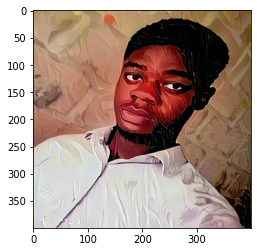

Start of iteration.  4
Current loss value:  828032000.0


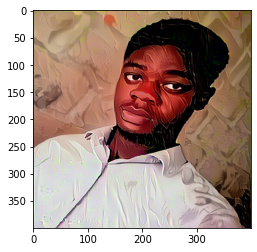

Start of iteration.  5
Current loss value:  740492000.0


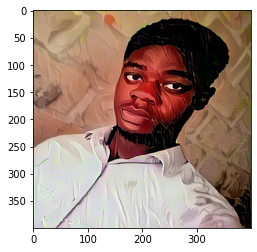

Start of iteration.  6
Current loss value:  675118660.0


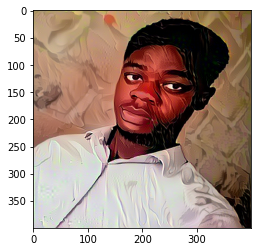

Start of iteration.  7
Current loss value:  624705000.0


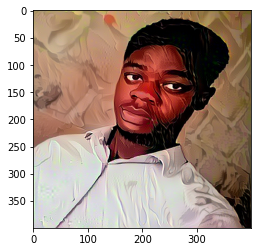

Start of iteration.  8
Current loss value:  578927500.0


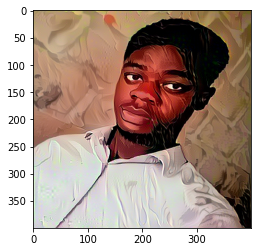

Start of iteration.  9
Current loss value:  545047000.0


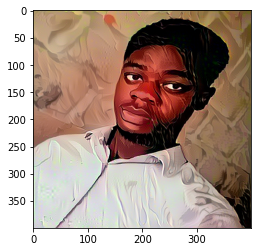

Start of iteration.  10
Current loss value:  518082370.0


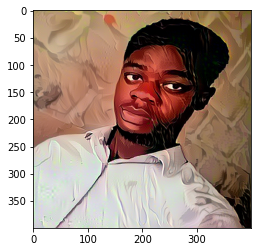

Start of iteration.  11
Current loss value:  491319840.0


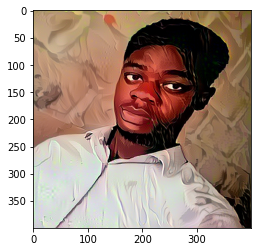

Start of iteration.  12
Current loss value:  472185340.0


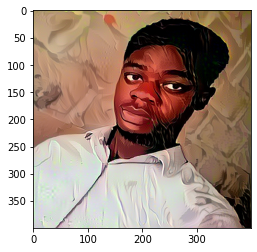

Start of iteration.  13
Current loss value:  455093470.0


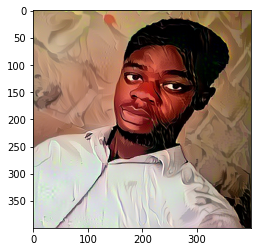

Start of iteration.  14
Current loss value:  439604260.0


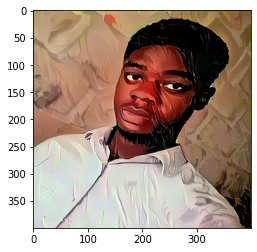

Start of iteration.  15
Current loss value:  424986240.0


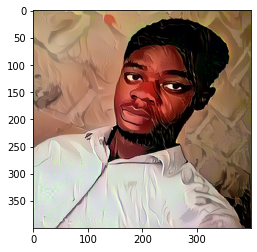

Start of iteration.  16
Current loss value:  412188450.0


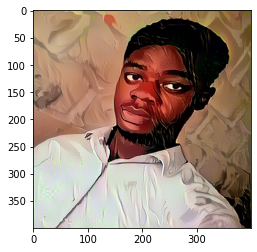

Start of iteration.  17
Current loss value:  400141470.0


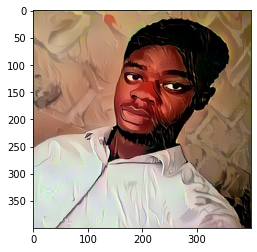

Start of iteration.  18
Current loss value:  388281950.0


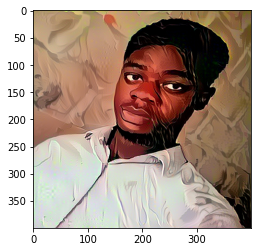

Start of iteration.  19
Current loss value:  378770200.0


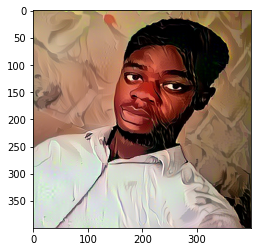

Start of iteration.  20
Current loss value:  371038050.0


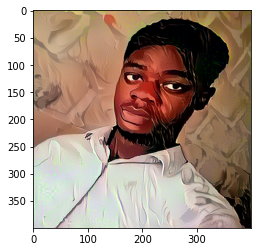

Start of iteration.  21
Current loss value:  361501340.0


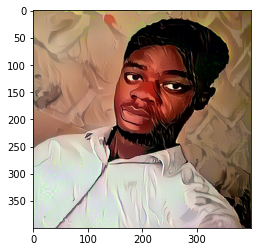

Start of iteration.  22
Current loss value:  354351800.0


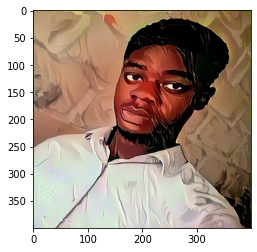

Start of iteration.  23
Current loss value:  347968350.0


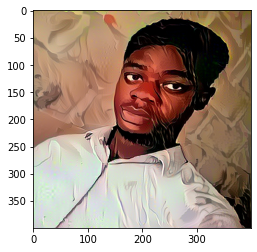

Start of iteration.  24
Current loss value:  341627780.0


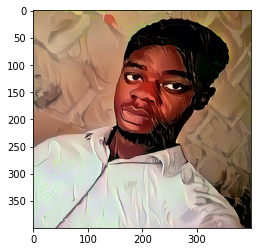

Start of iteration.  25
Current loss value:  335322000.0


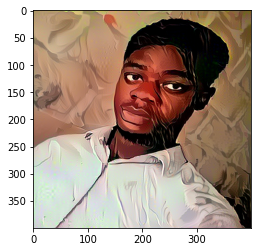

Start of iteration.  26
Current loss value:  330359260.0


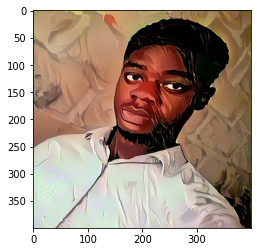

Start of iteration.  27
Current loss value:  326076300.0


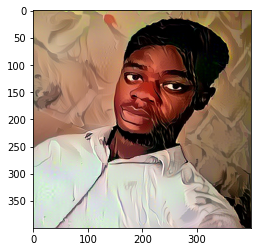

Start of iteration.  28
Current loss value:  321538180.0


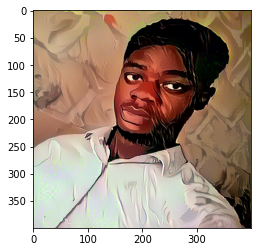

Start of iteration.  29
Current loss value:  317850400.0


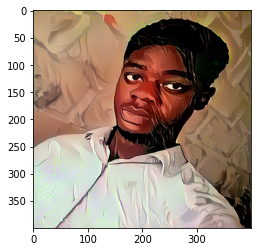

Start of iteration.  30
Current loss value:  312699200.0


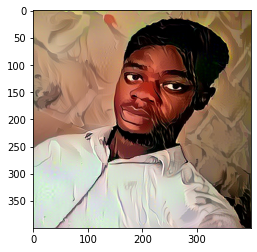

Start of iteration.  31
Current loss value:  307508160.0


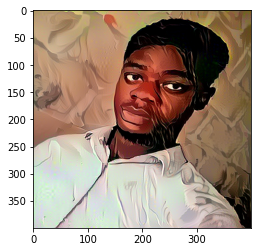

Start of iteration.  32
Current loss value:  303519070.0


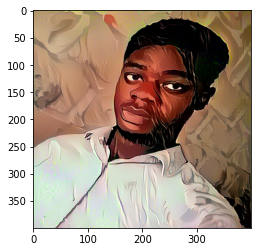

Start of iteration.  33
Current loss value:  299738140.0


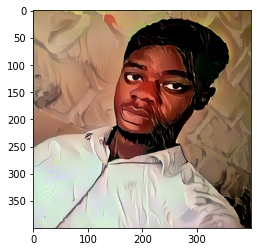

Start of iteration.  34
Current loss value:  296012800.0


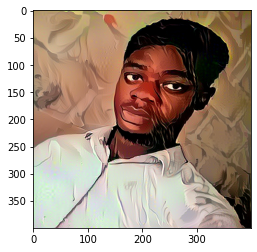

Start of iteration.  35
Current loss value:  292683520.0


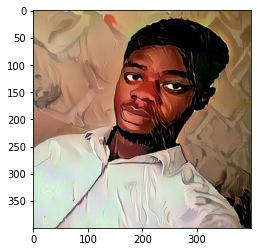

Start of iteration.  36
Current loss value:  288997800.0


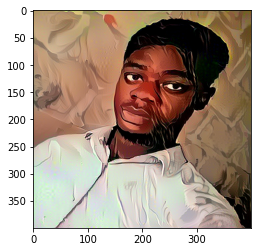

Start of iteration.  37
Current loss value:  285411360.0


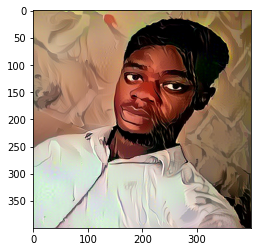

Start of iteration.  38
Current loss value:  281733820.0


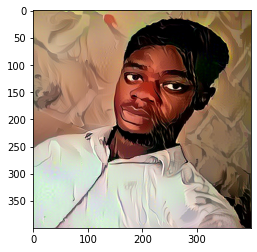

Start of iteration.  39
Current loss value:  278600700.0


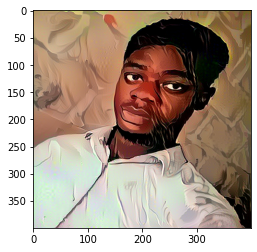

Start of iteration.  40
Current loss value:  276363650.0


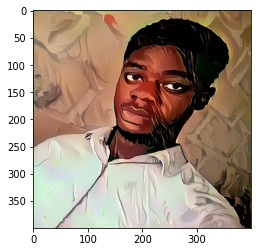

Start of iteration.  41
Current loss value:  273787230.0


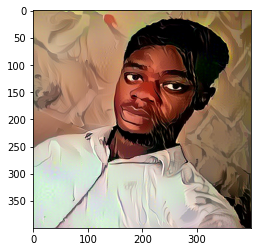

Start of iteration.  42
Current loss value:  271801760.0


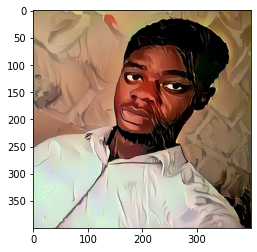

Start of iteration.  43
Current loss value:  269349570.0


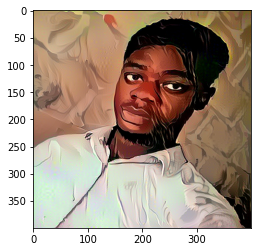

Start of iteration.  44
Current loss value:  266821820.0


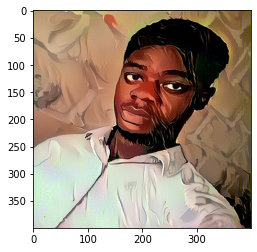

Start of iteration.  45
Current loss value:  265006800.0


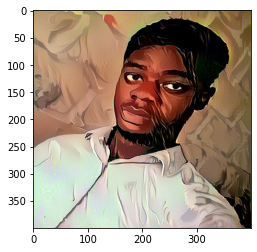

Start of iteration.  46
Current loss value:  263263540.0


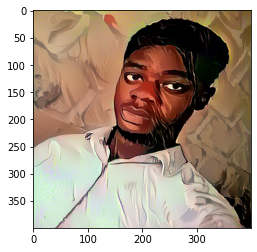

Start of iteration.  47
Current loss value:  261540860.0


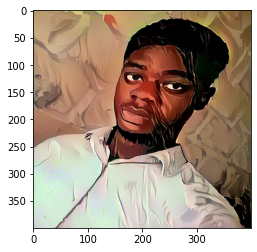

Start of iteration.  48
Current loss value:  259757540.0


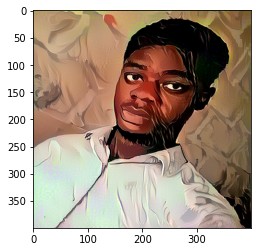

Start of iteration.  49
Current loss value:  257774700.0


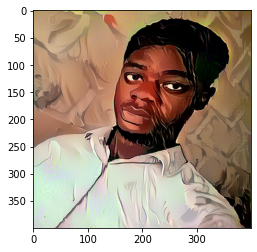

Start of iteration.  50
Current loss value:  255872350.0


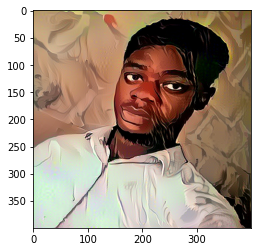

Start of iteration.  51
Current loss value:  254089020.0


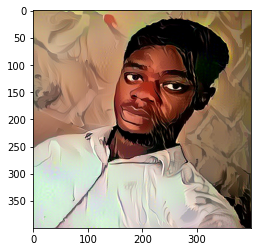

Start of iteration.  52
Current loss value:  252706140.0


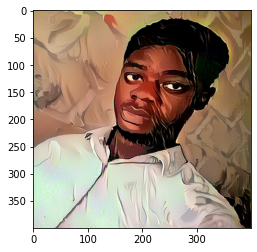

Start of iteration.  53
Current loss value:  251062300.0


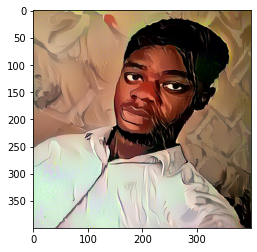

Start of iteration.  54
Current loss value:  249379700.0


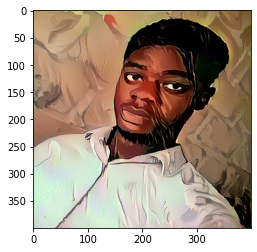

Start of iteration.  55
Current loss value:  247842510.0


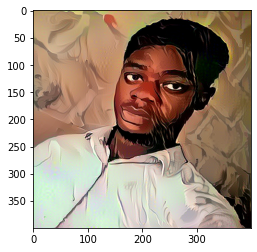

Start of iteration.  56
Current loss value:  246349680.0


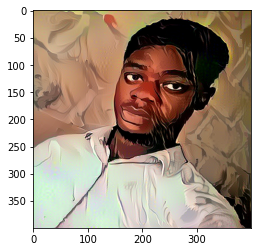

Start of iteration.  57
Current loss value:  244817630.0


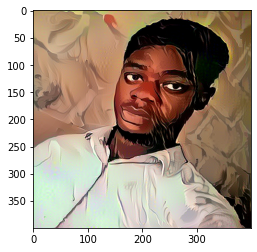

Start of iteration.  58
Current loss value:  243228420.0


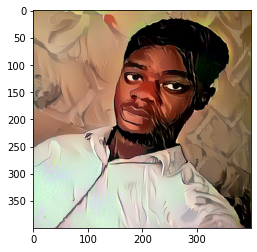

Start of iteration.  59
Current loss value:  241893970.0


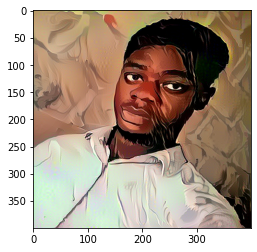

Start of iteration.  60
Current loss value:  240607140.0


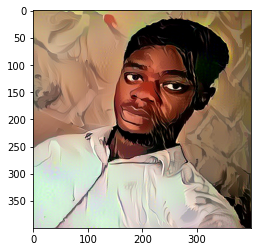

Start of iteration.  61
Current loss value:  239282670.0


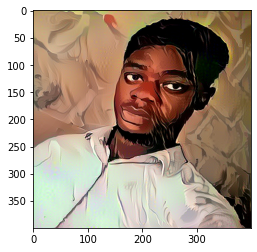

Start of iteration.  62
Current loss value:  238066820.0


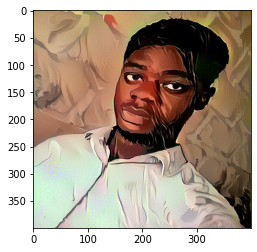

Start of iteration.  63
Current loss value:  237135550.0


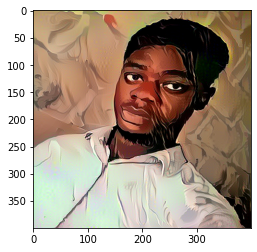

Start of iteration.  64
Current loss value:  235980220.0


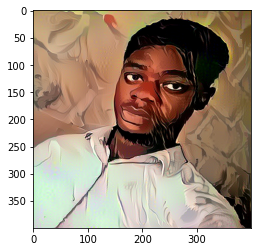

Start of iteration.  65
Current loss value:  234855520.0


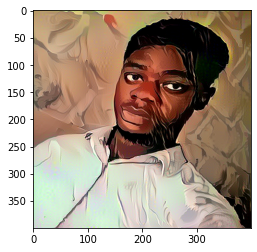

Start of iteration.  66
Current loss value:  233783790.0


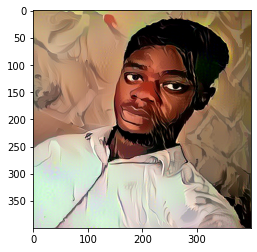

Start of iteration.  67
Current loss value:  232581340.0


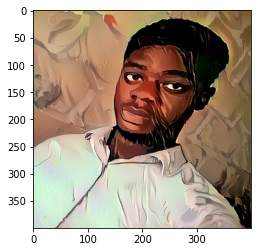

Start of iteration.  68
Current loss value:  231611710.0


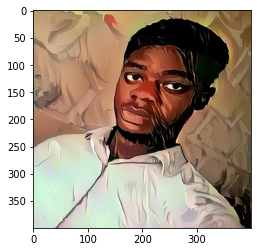

Start of iteration.  69
Current loss value:  230605280.0


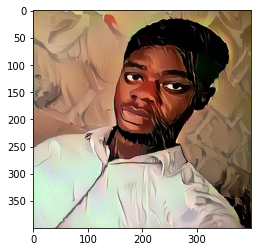

Start of iteration.  70
Current loss value:  229580480.0


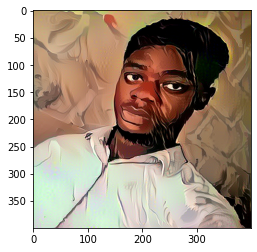

Start of iteration.  71
Current loss value:  228583580.0


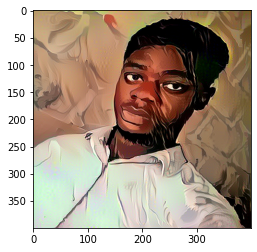

Start of iteration.  72
Current loss value:  227536220.0


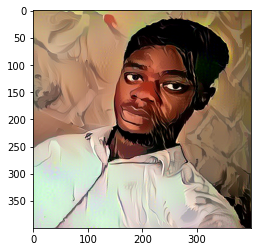

Start of iteration.  73
Current loss value:  226647310.0


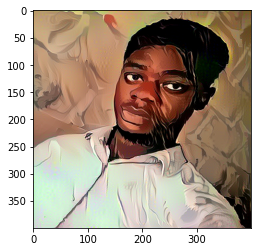

Start of iteration.  74
Current loss value:  225681550.0


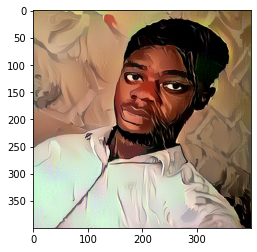

Start of iteration.  75
Current loss value:  224738080.0


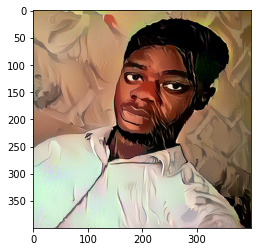

Start of iteration.  76
Current loss value:  224006140.0


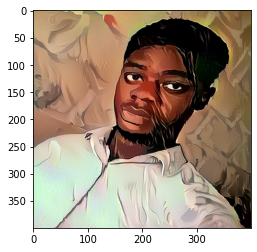

Start of iteration.  77
Current loss value:  223117000.0


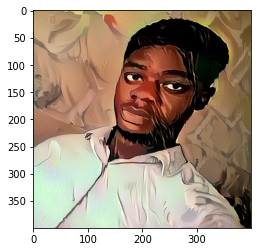

Start of iteration.  78
Current loss value:  222143020.0


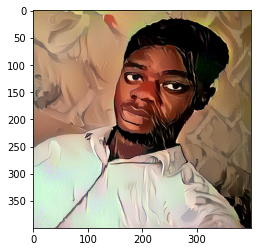

Start of iteration.  79
Current loss value:  221288830.0


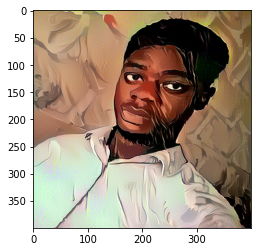

Start of iteration.  80
Current loss value:  220514620.0


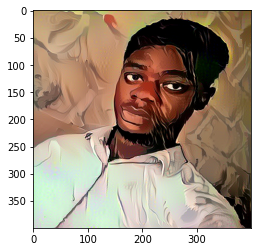

Start of iteration.  81
Current loss value:  219695220.0


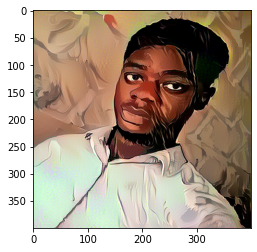

Start of iteration.  82
Current loss value:  218889540.0


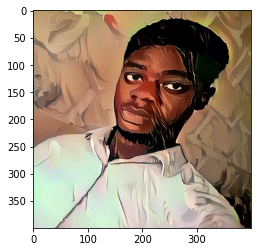

Start of iteration.  83
Current loss value:  218114300.0


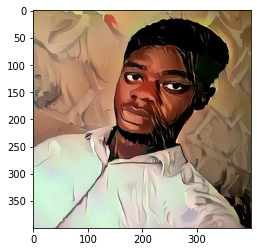

Start of iteration.  84
Current loss value:  217313470.0


In [0]:

from scipy.optimize import fmin_l_bfgs_b
import matplotlib.pyplot as plt
import time

x = target_image
x = x.flatten()
x = x.flatten()
print(x.shape)
for i in range(200):
  print("Start of iteration. ", i)
  start_time = time.time()
  x, min_val, info = fmin_l_bfgs_b(func = evaluator.loss, x0 = x, fprime = evaluator.grads, maxfun = 20, factr = 10, maxiter = 10)
  print("Current loss value: ", min_val)
  img = x.copy().reshape((400, 400 ,3))
  img = deprocess_image(img)
  plt.imshow(img)
  plt.show()
  end_time = time.time()
